In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.animation import FuncAnimation
from matplotlib.colors import LogNorm
from matplotlib.gridspec import GridSpec
from TDECalculator import TDECalculator
from scipy.interpolate import griddata

plt.style.use("plot_style.mplstyle")
plt.rc('text', usetex=True)

In [15]:
def energy_plots(whole_star_sample): 
    # unpack
    dE_rand   = whole_star_sample['dEnergy_random']      # shape (nr-1, N_Omega)
    dE_unp    = whole_star_sample['dEnergy_unperturbed']
    dT_rand   = whole_star_sample['dT_random']
    dT_unp    = whole_star_sample['dT_unperturbed']
    dMass     = whole_star_sample['dMass']               # same shape

    # set up figure
    fig, (axE, axT) = plt.subplots(1, 2, figsize=(12,5))

    # histograms in E
    bins_E = np.linspace(-2, 2, 200)
    axE.hist(dE_rand.flatten(),
            weights=dMass.flatten(),
            bins=bins_E,
            density=True,
            alpha=0.5)
    axE.set_yscale('log')
    axE.set_xlabel(r'$ E / \Delta E$')
    axE.set_ylabel(r'$(\mathrm{d}M/\mathrm{d}E) / (M_\star / \Delta E)$')

    # histograms in T
    bins_T = np.logspace(0, 6, 200)
    axT.hist(dT_rand.flatten(),
            weights=dMass.flatten(),
            bins=bins_T,
            density=True,
            alpha=0.5)
    # overplot T^{-5/3} reference
    axT.plot(bins_T, 10*bins_T**(-5/3), 'k--', label=r'$T^{-5/3}$')
    axT.set_xscale('log')
    axT.set_yscale('log')
    axT.set_xlabel(r'$T / \Delta T$')
    axT.set_ylabel(r'$(\mathrm{d}M/\mathrm{d}T) / (M_\star / \Delta T)$')

    plt.tight_layout()
    plt.show()

In [16]:
def plot_dens_helper(calcs):
    if not isinstance(calcs, (list, tuple)):
        calcs = [calcs]

    n = len(calcs)

    nbins = 300
    x_edges = np.linspace(-2, 2, nbins+1)
    y_edges = np.linspace(-3, 3, nbins+1)
    dx = x_edges[1] - x_edges[0]
    dy = y_edges[1] - y_edges[0]
    area = dx * dy

    # Precompute interpolated densities
    interp_densities = []
    for calc in calcs:
        equator_sample = calc.equator_sample(n_phi=3000)
        POS = equator_sample['POS']
        dMass = equator_sample['dMass']

        x_pos = POS[..., 0].flatten()
        y_pos = POS[..., 1].flatten()
        mass_flat = dMass.flatten()

        mass_hist, _, _ = np.histogram2d(
            x_pos, y_pos,
            bins=[x_edges, y_edges],
            weights=mass_flat
        )
        density2D = mass_hist / area

        Xc, Yc = np.meshgrid(
            0.5 * (x_edges[:-1] + x_edges[1:]),
            0.5 * (y_edges[:-1] + y_edges[1:])
        )
        density2D += 1e-12 * (Xc + Yc)

        points = np.column_stack((Xc.flatten(), Yc.flatten()))
        values = density2D.T.flatten()
        xi = np.linspace(Xc.min(), Xc.max(), nbins-1)
        yi = np.linspace(Yc.min(), Yc.max(), nbins-1)
        XI, YI = np.meshgrid(xi, yi)
        dens_interp = griddata(points, values, (XI, YI), method='linear')

        dens_interp += dens_interp.max() * 1e-8
        dens_interp /= dens_interp.max()

        interp_densities.append((dens_interp, XI, YI, calc))

    # Shared log-scale limits
    global_min = min(d[d[0] > 0].min() for d, _, _, _ in interp_densities)
    global_max = 1.0  # normalized
    levels = np.logspace(np.log10(global_min), np.log10(global_max), 100)
    norm = LogNorm(vmin=global_min, vmax=global_max)

    # Setup figure with extra column on RIGHT for colorbar
    fig = plt.figure(figsize=(n * 6 + 2, 9.7))
    gs = GridSpec(1, n + 1, width_ratios=[1]*n + [0.06], wspace=0.03)

    # Plot subplots
    for idx, (dens_interp, XI, YI, calc) in enumerate(interp_densities):
        ax = fig.add_subplot(gs[0, idx])

        cf = ax.contourf(XI, YI, dens_interp, levels=levels, cmap='viridis', norm=norm)

        phi0 = calc.Phi_TDE
        ax.arrow(-1.5, 2.25, -0.3*np.cos(phi0), -0.3*np.sin(phi0),
                 linewidth=2, head_width=0.1, head_length=0.1, color='white')
        ax.text(-1.5-0.3*np.cos(phi0)+0.1,
                2.25-0.3*np.sin(phi0)+0.1,
                'to BH', color='white', fontsize=18)

        beta = calc.Rtidal / calc.Rp
        name = calc.star_name[4:-4].replace('p', '.')
        ax.text(1.1, 2.5, fr'${name}\,M_\odot$',
                color='white', fontsize=28, fontweight='bold')
        ax.text(-1.7, -2.5, fr'$\beta={beta:.2f}$',
                color='white', fontsize=28, fontweight='bold')

        ax.set_aspect('equal')
        ax.axis('off')

    # Colorbar axis on far RIGHT
    cax = fig.add_subplot(gs[0, -1])
    cb = fig.colorbar(cf, cax=cax)
    cb.set_label('$\\rho/\\rho_c$')
    cb.set_ticks([1e-8, 1e-6, 1e-4, 1e-2, 1])

    plt.subplots_adjust(wspace=0.05, left=0.02, right=0.98, top=0.95, bottom=0.05)
    plt.show()

In [17]:
def plot_dens_time(mass, orbit, MBH, Rp, a, N):
    t0 = TDECalculator(mass, orbit, MBH, Rp, a, 0, N)
    t50 = TDECalculator(mass, orbit, MBH, Rp, a, 50, N)
    t100 = TDECalculator(mass, orbit, MBH, Rp, a, 100, N)
    t150 = TDECalculator(mass, orbit, MBH, Rp, a, 150, N)
    t200 = TDECalculator(mass, orbit, MBH, Rp, a, 200, N)

    calcs = [t0, t50, t100, t150, t200]

    plot_dens_helper(calcs)

In [18]:
mass = 'MAMS1Msun'
Mbh = 1e6
Rp = 4.9497 
a = 0.50
n = 1500

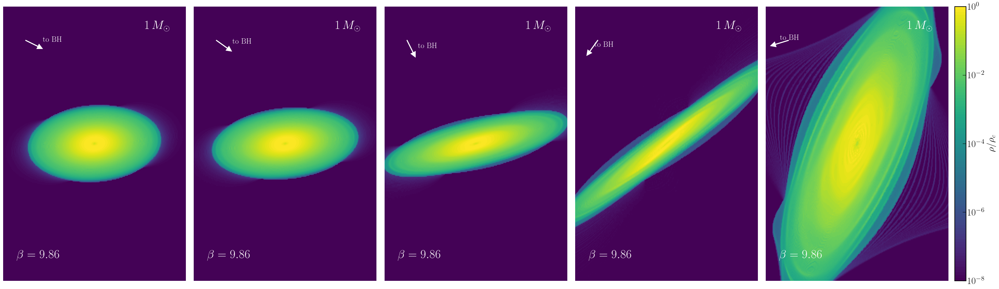

In [19]:
plot_dens_time(mass, 'rel', Mbh, Rp, -a, n)

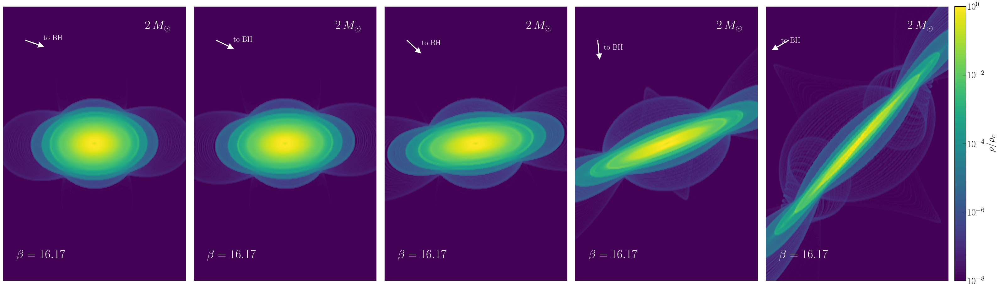

In [20]:
plot_dens_time('MAMS2Msun', 'rel', Mbh, Rp, -a, n)

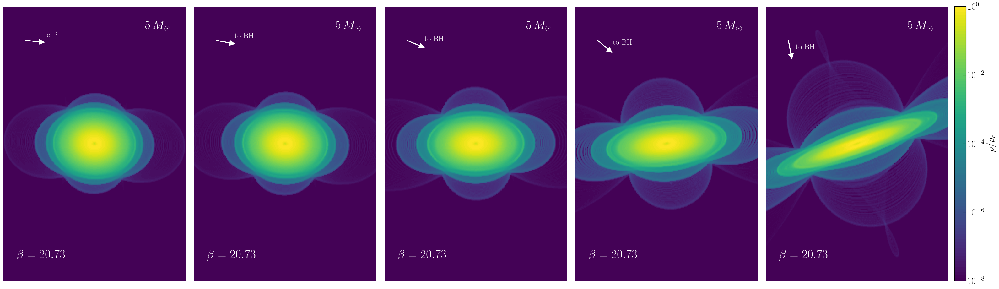

In [21]:
plot_dens_time('MAMS5Msun', 'rel', Mbh, Rp, -a, n)

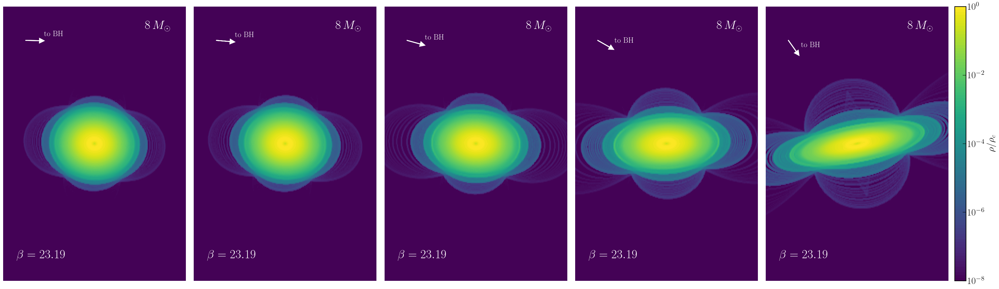

In [22]:
plot_dens_time('MAMS8Msun', 'rel', Mbh, Rp, -a, n)

In [23]:
def plot_dens_time2(mass, orbit, MBH, Rp, a, N):
    t0 = TDECalculator(mass, orbit, MBH, Rp, a, 0, N)
    t50 = TDECalculator(mass, orbit, MBH, Rp, a, 100, N)
    t100 = TDECalculator(mass, orbit, MBH, Rp, a, 200, N)
    t150 = TDECalculator(mass, orbit, MBH, Rp, a, 300, N)
    t200 = TDECalculator(mass, orbit, MBH, Rp, a, 400, N)

    calcs = [t0, t50, t100, t150, t200]

    plot_dens_helper(calcs)

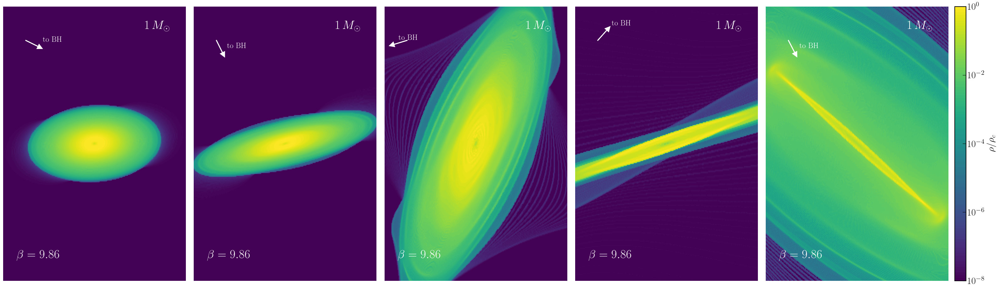

In [24]:
plot_dens_time2(mass, 'rel', Mbh, Rp, -a, n)

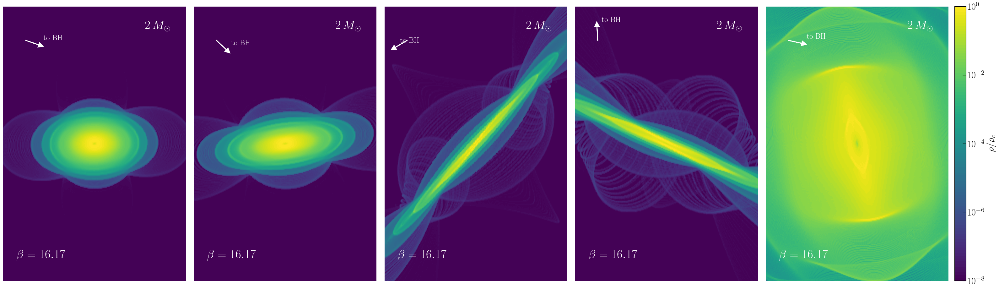

In [25]:
plot_dens_time2('MAMS2Msun', 'rel', Mbh, Rp, -a, n)

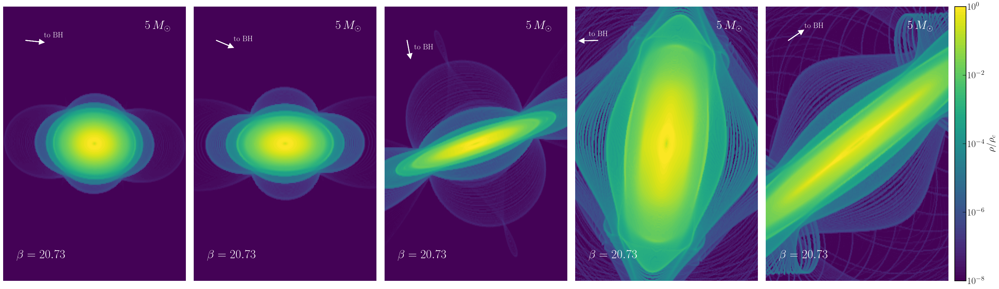

In [26]:
plot_dens_time2('MAMS5Msun', 'rel', Mbh, Rp, -a, n)

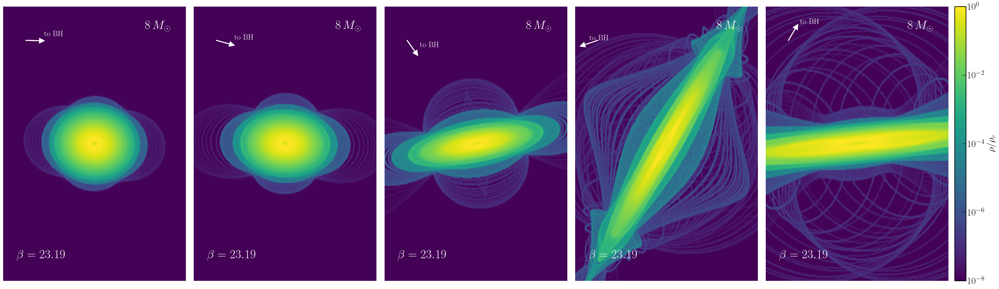

In [27]:
plot_dens_time2('MAMS8Msun', 'rel', Mbh, Rp, -a, n)

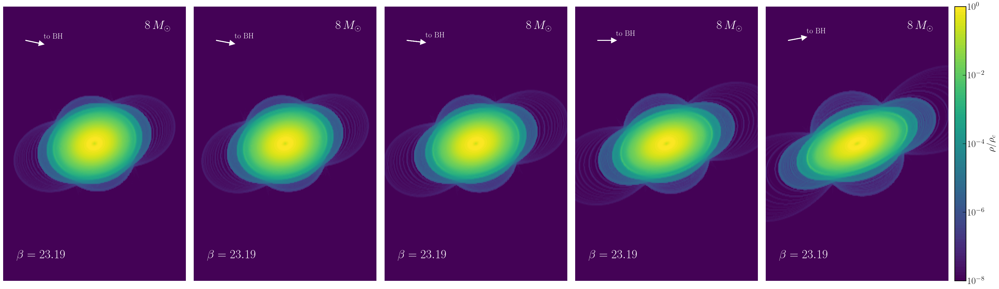

In [33]:
plot_dens_time('MAMS8Msun', 'rel', Mbh, Rp, a, n)

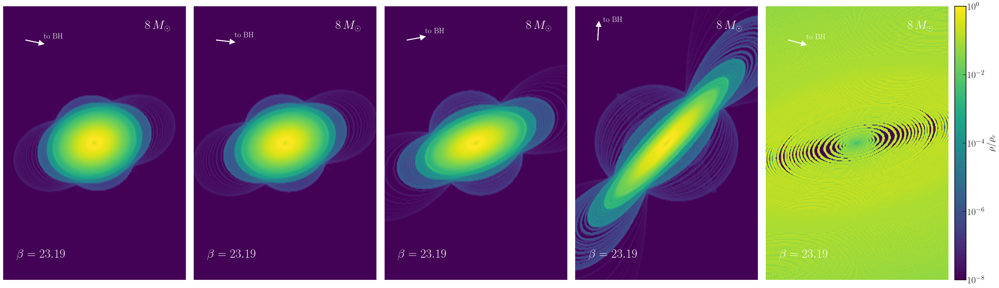

In [28]:
plot_dens_time2('MAMS8Msun', 'rel', Mbh, Rp, a, n)

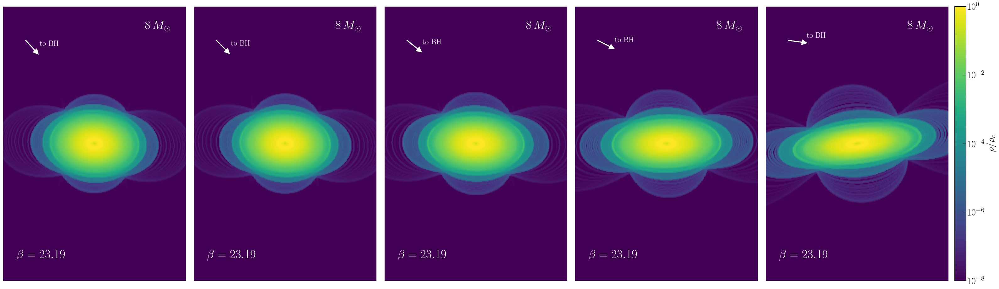

In [32]:
plot_dens_time('MAMS8Msun', 'rel', Mbh, Rp, 0.0, n)

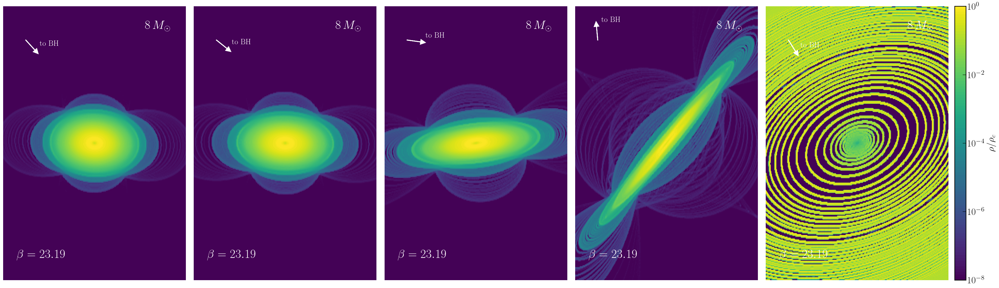

In [29]:
plot_dens_time2('MAMS8Msun', 'rel', Mbh, Rp, 0.0, n)

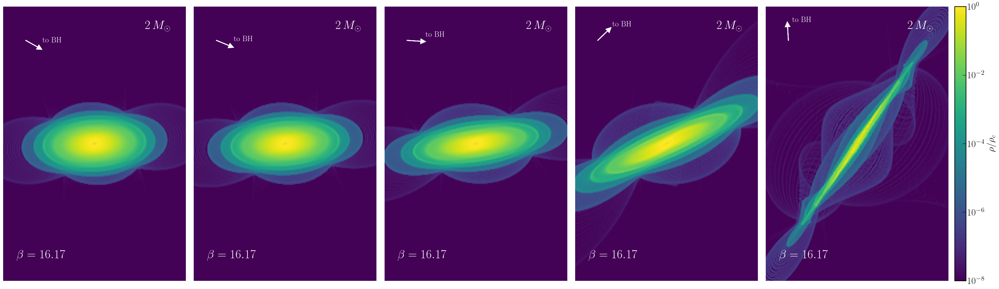

In [31]:
plot_dens_time('MAMS2Msun', 'rel', Mbh, Rp, 0.0, n)

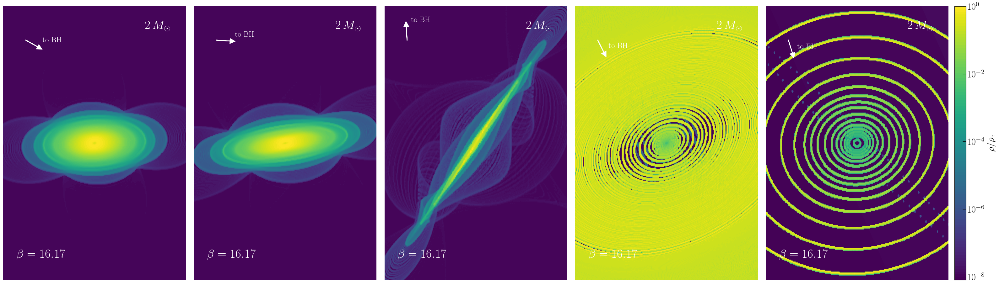

In [30]:
plot_dens_time2('MAMS2Msun', 'rel', Mbh, Rp, 0.0, n)